In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Pytorch-Models

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1aJsbt04Jz9xcLP_lg7fvP4Bpdce6GQlC/Pytorch-Models


In [ ]:
import os
import json

def count_images(image_dir, exts={".jpg", ".jpeg", ".png", ".bmp", ".webp"}):
    image_count = 0
    for filename in os.listdir(image_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            image_count += 1
    print(f"Total images: {image_count}")

count_images("datasets/sispanseg/train/images")
count_images("datasets/sispanseg/valid/images")

Total images: 200
Total images: 56


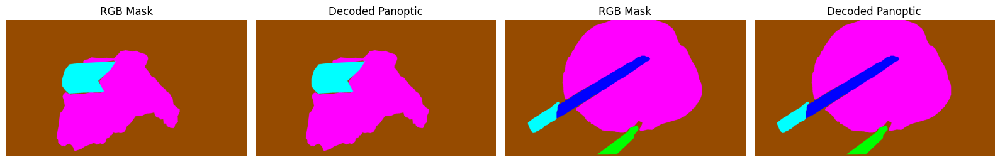

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -------------------------
# PATHS
# -------------------------
RGB_DIR = "datasets/sispanseg/train/rgbmasks"
MASK_DIR = "datasets/sispanseg/train/masks"

# -------------------------
# DEBUG COLORS (RGB)
# -------------------------
COLOR_Uterus = (255, 0, 255)            # Magenta - Suction
COLOR_BG = (150, 75, 0)                 # Brown
COLOR_Grasper_1 = (255, 0, 0)           # Red - Grasper
COLOR_Grasper_2 = (139, 0, 139)         # Purple
COLOR_Harmonic_ACE = (0, 255, 0)        # Green - Harmonic_Ace
COLOR_Myoma_Screw = (0, 0, 255)         # Blue - Myoma_Screw
COLOR_Needle_Holder_1 = (255, 255, 0)   # Yellow - Needle_Holder
COLOR_Needle_Holder_2 = (255, 174, 66)  # Orange Yellow
COLOR_Trocer = (0, 255, 255)            # Cyan - Trocar

Uterus = np.array(COLOR_Uterus)
BG = np.array(COLOR_BG)
Grasper_1 = np.array(COLOR_Grasper_1)
Grasper_2 = np.array(COLOR_Grasper_2)
Harmonic_ACE = np.array(COLOR_Harmonic_ACE)
Myoma_Screw = np.array(COLOR_Myoma_Screw)
Needle_Holder_1 = np.array(COLOR_Needle_Holder_1)
Needle_Holder_2 = np.array(COLOR_Needle_Holder_2)
Trocer = np.array(COLOR_Trocer)

# -------------------------
# LOAD FILES
# -------------------------
files = [f for f in os.listdir(RGB_DIR) if f.endswith(".png")]
samples = random.sample(files, 2)

# -------------------------
# FUNCTION: decode panoptic → RGB
# -------------------------
def decode_panoptic(mask):
    h, w = mask.shape
    out = np.zeros((h, w, 3), dtype=np.uint8)

    class_id = mask // 1000
    instance_id = mask % 1000

    # Grasper (class 1)
    Grasper1 = (class_id == 1) & (instance_id == 1)
    Grasper2 = (class_id == 1) & (instance_id == 2)

    out[Grasper1] = Grasper_1
    out[Grasper2] = Grasper_2

    # Harmonic (class 2)
    Harmonic = (class_id == 2)
    out[Harmonic] = Harmonic_ACE

    # Myoma Screw (class 3)
    Myoma = (class_id == 3)
    out[Myoma] = Myoma_Screw

    # Needle Holder (class 4)
    NeedleHolder1 = (class_id == 4) & (instance_id == 1)
    NeedleHolder2 = (class_id == 4) & (instance_id == 2)

    out[NeedleHolder1] = Needle_Holder_1
    out[NeedleHolder2] = Needle_Holder_2

    # Trocer (class 5)
    trocer = (class_id == 5)
    out[trocer] = Trocer

    # Uterus (class 6)
    uterus = (class_id == 6)
    out[uterus] = Uterus

    # Bg (class 7)
    Bg = (class_id == 7)
    out[Bg] = BG

    return out

# -------------------------
# PLOT
# -------------------------
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

for i, fname in enumerate(samples):
    rgb_path = os.path.join(RGB_DIR, fname)
    mask_path = os.path.join(MASK_DIR, fname)

    rgb = cv2.cvtColor(cv2.imread(rgb_path), cv2.COLOR_BGR2RGB)
    panoptic = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)

    decoded = decode_panoptic(panoptic)

    axes[i*2].imshow(rgb)
    axes[i*2].set_title(f"RGB Mask")
    axes[i*2].axis("off")

    axes[i*2+1].imshow(decoded)
    axes[i*2+1].set_title(f"Decoded Panoptic")
    axes[i*2+1].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm

def convert_to_semantic(src_dir, dest_dir):
    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)

    files = [f for f in os.listdir(src_dir) if f.endswith(".png")]
    print(f"Converting {len(files)} masks from {src_dir}...")

    for fname in tqdm(files):
        mask_path = os.path.join(src_dir, fname)
        # Load the panoptic mask (class * 1000 + instance)
        panoptic = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)

        # Get the class IDs
        class_id = panoptic // 1000

        # Initialize output grayscale mask (background/void = 255)
        semantic = np.full(panoptic.shape, 255, dtype=np.uint8)

        # 1. Map all THING classes to 0
        semantic[(class_id >= 1) & (class_id <= 5)] = 0

        # 2. Map STUFF classes to contiguous IDs starting from 1
        # Uterus (6) -> 1, BG (7) -> 2
        semantic[class_id == 6] = 1
        semantic[class_id == 7] = 2

        # Save as 8-bit grayscale PNG
        cv2.imwrite(os.path.join(dest_dir, fname), semantic)

# Convert Train and Val
convert_to_semantic("datasets/sispanseg/train/masks", "datasets/sispanseg/train/sem_seg")
convert_to_semantic("datasets/sispanseg/valid/masks", "datasets/sispanseg/valid/sem_seg")

Converting 200 masks from datasets/sispanseg/train/masks...


100%|██████████| 200/200 [00:15<00:00, 12.65it/s]


Converting 56 masks from datasets/sispanseg/valid/masks...


100%|██████████| 56/56 [00:55<00:00,  1.01it/s]


In [ ]:
import os
import json

def count_images(image_dir, exts={".jpg", ".jpeg", ".png", ".bmp", ".webp"}):
    image_count = 0
    for filename in os.listdir(image_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            image_count += 1
    print(f"Total images: {image_count}")

count_images("datasets/sispanseg/train/sem_seg")
count_images("datasets/sispanseg/valid/sem_seg")

Total images: 200
Total images: 56


In [ ]:
import os
import numpy as np
from PIL import Image
from tqdm import tqdm
from collections import defaultdict

def analyze_semantic_classes(mask_dir, class_names=None):
    """
    - Reports unique semantic class IDs
    - Counts total pixel frequency for each class ID
    """
    pixel_counts = defaultdict(int)
    unique_ids = set()
    total_pixels = 0

    mask_files = [f for f in os.listdir(mask_dir) if f.endswith('.png')]
    for file in tqdm(mask_files, desc=f"Analyzing {mask_dir}"):
        mask_path = os.path.join(mask_dir, file)
        mask = np.array(Image.open(mask_path))
        total_pixels += mask.size

        ids, counts = np.unique(mask, return_counts=True)
        for i, c in zip(ids, counts):
            pixel_counts[i] += c
            unique_ids.add(i)

    # Sort class IDs
    sorted_ids = sorted(unique_ids)
    print(f"\n✅ Found {len(mask_files)} mask files in {mask_dir}")
    print(f"🔢 Unique Class IDs: {sorted_ids}\n")

    print("📊 Pixel Distribution:")
    for cid in sorted_ids:
        name = class_names.get(cid, f"Class {cid}") if class_names else f"Class {cid}"
        pct = 100 * pixel_counts[cid] / total_pixels
        print(f"  {cid:>2} → {name:<20} | Pixels: {pixel_counts[cid]:>10,} ({pct:.2f}%)")

    return sorted_ids, pixel_counts

CLASS_NAMES = {
    0: "Things",
    1: "Uterus",
    2: "BG",
}
# Check training set
train_ids, train_counts = analyze_semantic_classes("datasets/sispanseg/train/sem_seg", CLASS_NAMES)

# Check validation set
valid_ids, valid_counts = analyze_semantic_classes("datasets/sispanseg/valid/sem_seg", CLASS_NAMES)

Analyzing datasets/sispanseg/train/sem_seg: 100%|██████████| 200/200 [00:11<00:00, 17.87it/s]



✅ Found 200 mask files in datasets/sispanseg/train/sem_seg
🔢 Unique Class IDs: [np.uint8(0), np.uint8(1), np.uint8(2)]

📊 Pixel Distribution:
   0 → Things               | Pixels: 26,612,277 (6.46%)
   1 → Uterus               | Pixels: 124,559,111 (30.26%)
   2 → BG                   | Pixels: 260,524,612 (63.28%)


Analyzing datasets/sispanseg/valid/sem_seg: 100%|██████████| 56/56 [00:02<00:00, 19.37it/s]


✅ Found 56 mask files in datasets/sispanseg/valid/sem_seg
🔢 Unique Class IDs: [np.uint8(0), np.uint8(1), np.uint8(2)]

📊 Pixel Distribution:
   0 → Things               | Pixels:  8,594,838 (7.46%)
   1 → Uterus               | Pixels: 32,897,274 (28.54%)
   2 → BG                   | Pixels: 73,782,768 (64.01%)


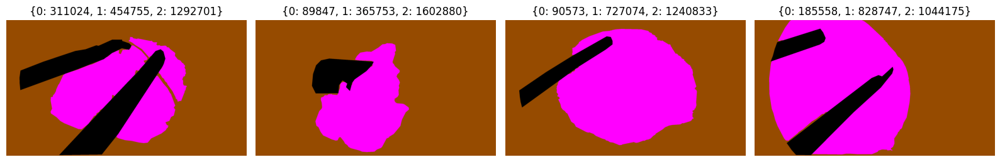

In [ ]:
import os
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define class ID to RGB color mapping
CATEGORY_COLORS = {
    0: [0, 0, 0],           # Things (Black)
    1: [255, 0, 255],       # Uterus (Magenta)
    2: [150, 75, 0],        # BG (Brown)
}

def decode_mask(mask):
    """Convert class ID mask to RGB color mask"""
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for class_id, color in CATEGORY_COLORS.items():
        color_mask[mask == class_id] = color
    return color_mask

def count_classes(mask):
    """Count pixel occurrences for each class"""
    unique, counts = np.unique(mask, return_counts=True)
    return dict(zip(unique.tolist(), counts.tolist()))

def visualize_random_semantics(mask_dir, num_samples=4):
    mask_files = [f for f in os.listdir(mask_dir) if f.endswith('.png')]
    selected = random.sample(mask_files, num_samples)

    fig, axes = plt.subplots(1, num_samples, figsize=(16, 4))
    for i, filename in enumerate(selected):
        path = os.path.join(mask_dir, filename)
        mask = np.array(Image.open(path))
        color_mask = decode_mask(mask)
        class_counts = count_classes(mask)

        axes[i].imshow(color_mask)
        axes[i].set_title(f"{class_counts}")
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

# Example usage:
visualize_random_semantics("datasets/sispanseg/train/sem_seg")

In [ ]:
import torch
import numpy as np

# Pixel counts from earlier
pixel_counts = np.array([26612277, 124559111, 260524612])
inv_freq = 1.0 / (pixel_counts + 1e-6)
weights = inv_freq / inv_freq.sum()
class_weights = torch.tensor(weights, dtype=torch.float32)

print("Normalized class weights:", class_weights)

Normalized class weights: tensor([0.7600, 0.1624, 0.0776])


In [ ]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

def get_transforms(train=True):
    if train:
        return A.Compose([
            A.Resize(512, 512),
            A.HorizontalFlip(p=0.5),
            A.RandomBrightnessContrast(p=0.2),
            A.Normalize(mean=(0.485, 0.456, 0.406),
                        std=(0.229, 0.224, 0.225)),
            ToTensorV2()
        ])
    else:
        return A.Compose([
            A.Resize(512, 512),
            A.Normalize(mean=(0.485, 0.456, 0.406),
                        std=(0.229, 0.224, 0.225)),
            ToTensorV2()
        ])

In [ ]:
import os
import torch
from torch.utils.data import Dataset
import cv2

class SemanticSegDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.image_files = sorted(os.listdir(image_dir))

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_name = self.image_files[idx]
        img_path = os.path.join(self.image_dir, image_name)
        mask_path = os.path.join(self.mask_dir, image_name.replace(".jpg", ".png"))

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask'].long()

        return image, mask

In [ ]:
from torch.utils.data import DataLoader

def get_dataloaders(base_path="datasets/sispanseg", batch_size=4):
    train_dataset = SemanticSegDataset(
        image_dir=os.path.join(base_path, "train/images"),
        mask_dir=os.path.join(base_path, "train/sem_seg"),
        transform=get_transforms(train=True)
    )
    valid_dataset = SemanticSegDataset(
        image_dir=os.path.join(base_path, "valid/images"),
        mask_dir=os.path.join(base_path, "valid/sem_seg"),
        transform=get_transforms(train=False)
    )

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
    valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    return train_loader, valid_loader, train_dataset, valid_dataset
train_loader, val_loader, train_dataset, valid_dataset = get_dataloaders(batch_size=4)

In [ ]:
import torch
import numpy as np

def compute_confusion_matrix(preds, labels, num_classes):
    """
    Compute confusion matrix for mIoU.
    preds, labels: shape (H, W), both should be flattened
    """
    mask = (labels >= 0) & (labels < num_classes)
    conf_matrix = torch.bincount(
        num_classes * labels[mask] + preds[mask],
        minlength=num_classes**2
    ).reshape(num_classes, num_classes).to(torch.int64)
    return conf_matrix

def compute_miou(conf_matrix):
    """
    Returns mIoU and per-class IoU
    """
    tp = torch.diag(conf_matrix)
    fp = conf_matrix.sum(dim=0) - tp
    fn = conf_matrix.sum(dim=1) - tp
    denom = tp + fp + fn
    iou = tp.float() / (denom.float() + 1e-6)

    miou = iou.mean().item()
    return miou, iou.tolist()

def evaluate(model, dataloader, device, num_classes):
    model.eval()
    conf_matrix = torch.zeros((num_classes, num_classes), dtype=torch.int64)  # stays on CPU

    with torch.no_grad():
        for images, masks in dataloader:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)['out']
            preds = torch.argmax(outputs, dim=1)

            for p, t in zip(preds, masks):
                p = p.cpu().view(-1)
                t = t.cpu().view(-1)
                conf_matrix += compute_confusion_matrix(p, t, num_classes)

    miou, class_ious = compute_miou(conf_matrix)
    print(f"📊 mIoU: {miou:.4f}")
    return miou

In [ ]:
from tqdm import tqdm
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import os
from torch.amp import autocast, GradScaler

scaler = GradScaler()

def train_deeplabv3_r50(train_loader, val_loader, class_weights, num_classes=3, num_epochs=20, save_path="DeepLabV3_models/deeplabv3_r50_best_Pan.pth"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    os.makedirs(os.path.dirname(save_path), exist_ok=True)

    # Load DeepLabV3 with ResNet-50 backbone
    model = torchvision.models.segmentation.deeplabv3_resnet50(weights="DEFAULT", weights_backbone="DEFAULT")
    model.classifier[-1] = nn.Conv2d(256, num_classes, kernel_size=1)  # Replace final layer
    model.to(device)

    # Loss + optimizer
    criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))
    optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    best_miou = 0.0

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False)

        for images, masks in loop:
            images = images.to(device)
            masks = masks.to(device)

            optimizer.zero_grad()
            with autocast(device_type="cuda"):
                outputs = model(images)['out']
                loss = criterion(outputs, masks)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            running_loss += loss.item()

            loop.set_postfix(loss=loss.item())

        avg_loss = running_loss / len(train_loader)
        print(f"\n📦 Epoch [{epoch+1}/{num_epochs}] - Avg Loss: {avg_loss:.4f}")

        # Evaluate
        miou = evaluate(model, val_loader, device, num_classes)
        if miou > best_miou:
            best_miou = miou
            torch.save(model.state_dict(), save_path)
            print(f"✅ New best model saved at {save_path} (mIoU: {miou:.4f})")

        scheduler.step()

    print(f"\n🎯 Training complete. Best mIoU: {best_miou:.4f}")

In [ ]:
# Define class weights (from earlier)
class_weights = torch.tensor([0.7600, 0.1624, 0.0776], dtype=torch.float32)

# Run training
train_deeplabv3_r50(train_loader, val_loader, class_weights, num_classes=3, num_epochs=20, save_path="DeepLabV3_models/deeplabv3_r50_best_Pan.pth")

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth


100%|██████████| 161M/161M [00:01<00:00, 132MB/s]
                                                                       


📦 Epoch [1/20] - Avg Loss: 0.4509


📊 mIoU: 0.8404
✅ New best model saved at DeepLabV3_models/deeplabv3_r50_best_Pan.pth (mIoU: 0.8404)



📦 Epoch [2/20] - Avg Loss: 0.1744


📊 mIoU: 0.8771
✅ New best model saved at DeepLabV3_models/deeplabv3_r50_best_Pan.pth (mIoU: 0.8771)



📦 Epoch [3/20] - Avg Loss: 0.1277


📊 mIoU: 0.8894
✅ New best model saved at DeepLabV3_models/deeplabv3_r50_best_Pan.pth (mIoU: 0.8894)



📦 Epoch [4/20] - Avg Loss: 0.1013


📊 mIoU: 0.9081
✅ New best model saved at DeepLabV3_models/deeplabv3_r50_best_Pan.pth (mIoU: 0.9081)



📦 Epoch [5/20] - Avg Loss: 0.0905


📊 mIoU: 0.9035



📦 Epoch [6/20] - Avg Loss: 0.0780


📊 mIoU: 0.9146
✅ New best model saved at DeepLabV3_models/deeplabv3_r50_best_Pan.pth (mIoU: 0.9146)



📦 Epoch [7/20] - Avg Loss: 0.0665


📊 mIoU: 0.9161
✅ New best model saved at DeepLabV3_models/deeplabv3_r50_best_Pan.pth (mIoU: 0.9161)



📦 Epoch [8/20] - Avg Loss: 0.0598


📊 mIoU: 0.9213
✅ New best model saved at DeepLabV3_models/deeplabv3_r50_best_Pan.pth (mIoU: 0.9213)



📦 Epoch [9/20] - Avg Loss: 0.0559


📊 mIoU: 0.9310
✅ New best model saved at DeepLabV3_models/deeplabv3_r50_best_Pan.pth (mIoU: 0.9310)



📦 Epoch [10/20] - Avg Loss: 0.0564


📊 mIoU: 0.9301



📦 Epoch [11/20] - Avg Loss: 0.0489


📊 mIoU: 0.9286



📦 Epoch [12/20] - Avg Loss: 0.0452


📊 mIoU: 0.9223



📦 Epoch [13/20] - Avg Loss: 0.0444


📊 mIoU: 0.9264



📦 Epoch [14/20] - Avg Loss: 0.0417


📊 mIoU: 0.9301



📦 Epoch [15/20] - Avg Loss: 0.0406


📊 mIoU: 0.9299



📦 Epoch [16/20] - Avg Loss: 0.0396


📊 mIoU: 0.9293



📦 Epoch [17/20] - Avg Loss: 0.0384


📊 mIoU: 0.9309



📦 Epoch [18/20] - Avg Loss: 0.0378


📊 mIoU: 0.9321
✅ New best model saved at DeepLabV3_models/deeplabv3_r50_best_Pan.pth (mIoU: 0.9321)



📦 Epoch [19/20] - Avg Loss: 0.0380


📊 mIoU: 0.9317



📦 Epoch [20/20] - Avg Loss: 0.0374


📊 mIoU: 0.9311

🎯 Training complete. Best mIoU: 0.9321


In [ ]:
import torch
import torchvision
import torch.nn as nn
from tqdm import tqdm
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score

CLASS_NAMES = ["Things", "Uterus", "BG"]
NUM_CLASSES = len(CLASS_NAMES)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def load_model():
    model = torchvision.models.segmentation.deeplabv3_resnet50(weights=None, weights_backbone=None)
    model.classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load("DeepLabV3_models/deeplabv3_r50_best_Pan.pth"), strict=False)
    return model.to(DEVICE).eval()

# Metric computation
def evaluate_per_class(model, dataloader):
    iou_per_class = np.zeros(NUM_CLASSES)
    total_pixels_per_class = np.zeros(NUM_CLASSES)
    intersection = np.zeros(NUM_CLASSES)
    union = np.zeros(NUM_CLASSES)

    y_true_all = []
    y_pred_all = []

    with torch.no_grad():
        for images, masks in tqdm(dataloader, desc="Evaluating"):
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)

            outputs = model(images)['out']
            preds = torch.argmax(outputs, dim=1)

            for c in range(NUM_CLASSES):
                pred_c = (preds == c)
                true_c = (masks == c)

                intersection[c] += (pred_c & true_c).sum().item()
                union[c] += (pred_c | true_c).sum().item()

            y_true_all.extend(masks.cpu().view(-1).numpy())
            y_pred_all.extend(preds.cpu().view(-1).numpy())

    iou = intersection / (union + 1e-6)
    precision = precision_score(y_true_all, y_pred_all, average=None, labels=list(range(NUM_CLASSES)), zero_division=0)
    recall = recall_score(y_true_all, y_pred_all, average=None, labels=list(range(NUM_CLASSES)), zero_division=0)
    f1 = f1_score(y_true_all, y_pred_all, average=None, labels=list(range(NUM_CLASSES)), zero_division=0)

    return iou, precision, recall, f1

# Run for all models
models = {
    "DeepLabV3-R50": load_model(),
}

results = {}

for name, model in models.items():
    iou, prec, rec, f1 = evaluate_per_class(model, val_loader)
    results[name] = {
        "IoU": iou,
        "Precision": prec,
        "Recall": rec,
        "F1": f1
    }

# Print comparison with averages
print("\n📊 Per-Class Evaluation Metrics:")
header = f"{'Class':<18} | {'Model':<15} | {'IoU':>6} | {'Precision':>9} | {'Recall':>7} | {'F1':>7}"
print("-" * len(header))
print(header)
print("-" * len(header))

for i, class_name in enumerate(CLASS_NAMES):
    for model_name in models.keys():
        row = results[model_name]
        print(f"{class_name:<18} | {model_name:<15} | {row['IoU'][i]:6.4f} | {row['Precision'][i]:9.4f} | {row['Recall'][i]:7.4f} | {row['F1'][i]:7.4f}")
    print("-" * len(header))

# Print average per model
print("\n📈 Average Metrics per Model:")
print("-" * 60)
print(f"{'Model':<15} | {'mIoU':>6} | {'Precision':>9} | {'Recall':>7} | {'F1':>7}")
print("-" * 60)
for model_name in models.keys():
    row = results[model_name]
    avg_iou = np.mean(row['IoU'])
    avg_precision = np.mean(row['Precision'])
    avg_recall = np.mean(row['Recall'])
    avg_f1 = np.mean(row['F1'])
    print(f"{model_name:<15} | {avg_iou:6.4f} | {avg_precision:9.4f} | {avg_recall:7.4f} | {avg_f1:7.4f}")

Evaluating: 100%|██████████| 14/14 [00:09<00:00,  1.43it/s]



📊 Per-Class Evaluation Metrics:
-----------------------------------------------------------------------------
Class              | Model           |    IoU | Precision |  Recall |      F1
-----------------------------------------------------------------------------
Things             | DeepLabV3-R50   | 0.8888 |    0.9026 |  0.9831 |  0.9412
-----------------------------------------------------------------------------
Uterus             | DeepLabV3-R50   | 0.9398 |    0.9613 |  0.9768 |  0.9690
-----------------------------------------------------------------------------
BG                 | DeepLabV3-R50   | 0.9677 |    0.9924 |  0.9749 |  0.9836
-----------------------------------------------------------------------------

📈 Average Metrics per Model:
------------------------------------------------------------
Model           |   mIoU | Precision |  Recall |      F1
------------------------------------------------------------
DeepLabV3-R50   | 0.9321 |    0.9521 |  0.9783 |  0.9646

In [ ]:
import matplotlib.pyplot as plt
import random
import math
import numpy as np
import torchvision
import torch
import torch.nn as nn
from PIL import Image
import io
from IPython.display import display, Image as IPyImage

# Category definitions
CATEGORY_COLORS = {
    0: [0, 0, 0],           # Things (Black)
    1: [255, 0, 255],       # Uterus (Magenta)
    2: [150, 75, 0],        # BG (Brown)
}

CLASS_NAMES = ["Things", "Uterus", "BG"]
NUM_CLASSES = len(CLASS_NAMES)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Mean/STD for ImageNet
IMG_MEAN = np.array([0.485, 0.456, 0.406])
IMG_STD = np.array([0.229, 0.224, 0.225])

# Utility functions
def decode_mask(mask):
    h, w = mask.shape
    rgb = np.zeros((h, w, 3), dtype=np.uint8)
    for cls, color in CATEGORY_COLORS.items():
        rgb[mask == cls] = color
    return rgb

def denormalize(img_tensor):
    img = img_tensor.permute(1, 2, 0).cpu().numpy()
    img = (img * IMG_STD + IMG_MEAN) * 255.0
    return np.clip(img, 0, 255).astype(np.uint8)

def load_model():
    model = torchvision.models.segmentation.deeplabv3_resnet50(weights=None, weights_backbone=None)
    model.classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load("DeepLabV3_models/deeplabv3_r50_best_Pan.pth"), strict=False)
    return model.to(DEVICE).eval()

models = {
    "DeepLabV3-R50": load_model(),
}

# Visualization function
def visualize_all_models(dataset, num_images=4, alpha=0.4):
    indices = random.sample(range(len(dataset)), num_images)
    fig, axes = plt.subplots(num_images, 4, figsize=(24, 6 * num_images))

    if num_images == 1:
        axes = np.expand_dims(axes, 0)

    for row, idx in enumerate(indices):
        image, gt = dataset[idx]
        input_tensor = image.unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            preds = {}
            overlays = {}
            for name, model in models.items():
                out = model(input_tensor)["out"]
                pred_mask = torch.argmax(out, dim=1).squeeze().cpu().numpy()
                pred_rgb = decode_mask(pred_mask)
                overlay = ((1 - alpha) * denormalize(image) + alpha * pred_rgb).astype(np.uint8)
                preds[name] = pred_rgb
                overlays[name] = overlay

        image_np = denormalize(image)
        gt_rgb = decode_mask(gt.numpy())

        # Original
        axes[row][0].imshow(image_np)
        axes[row][0].set_title("Original")

        # Ground Truth
        axes[row][1].imshow(gt_rgb)
        axes[row][1].set_title("Ground Truth")

        axes[row][2].imshow(preds["DeepLabV3-R50"])
        axes[row][2].set_title("DeepLabV3-R50 Prediction")

        # Overlays
        axes[row][3].imshow(overlays["DeepLabV3-R50"])
        axes[row][3].set_title("DeepLabV3-R50 Overlay")

        for col in range(4):
            axes[row][col].axis("off")

    plt.tight_layout()
    buf = io.BytesIO()
    fig.savefig(buf, format="png", dpi=100)
    plt.close(fig)
    buf.seek(0)
    display(IPyImage(data=buf.read()))

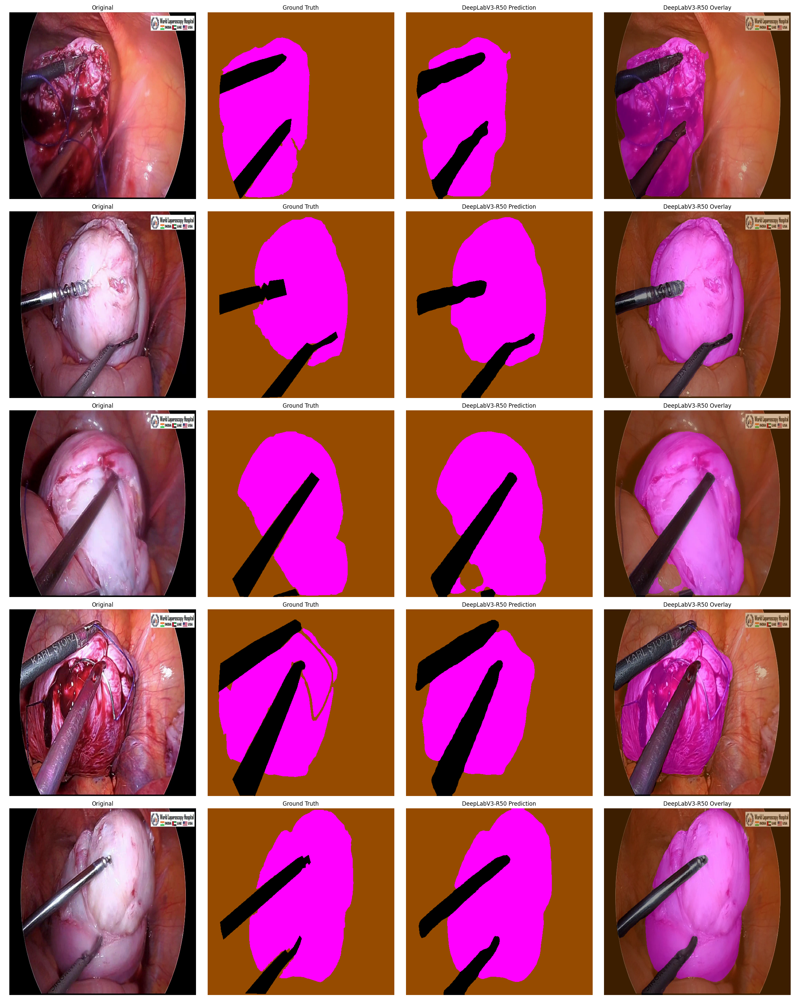

In [ ]:
visualize_all_models(valid_dataset, num_images=5, alpha=0.4)

In [ ]:
def visualize_deeplabv3(dataset, num_images=4, alpha=0.4):
    indices = random.sample(range(len(dataset)), num_images)

    # Prepare grid layout
    cols = 4
    rows = math.ceil(num_images / cols)
    plt.figure(figsize=(cols * 4, 3 * rows))

    for idx, img_path in enumerate(indices):
        image, gt = dataset[img_path]
        input_tensor = image.unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            preds = {}
            overlays = {}
            for name, model in models.items():
                out = model(input_tensor)["out"]
                pred_mask = torch.argmax(out, dim=1).squeeze().cpu().numpy()
                pred_rgb = decode_mask(pred_mask)
                overlay = ((1 - alpha) * denormalize(image) + alpha * pred_rgb).astype(np.uint8)
                preds[name] = pred_rgb
                overlays[name] = overlay

        # -------------------------
        # SHOW
        # -------------------------
        plt.subplot(rows, cols, idx + 1)
        plt.imshow(overlays["DeepLabV3-R50"])
        plt.axis("off")

    plt.tight_layout()
    plt.show()

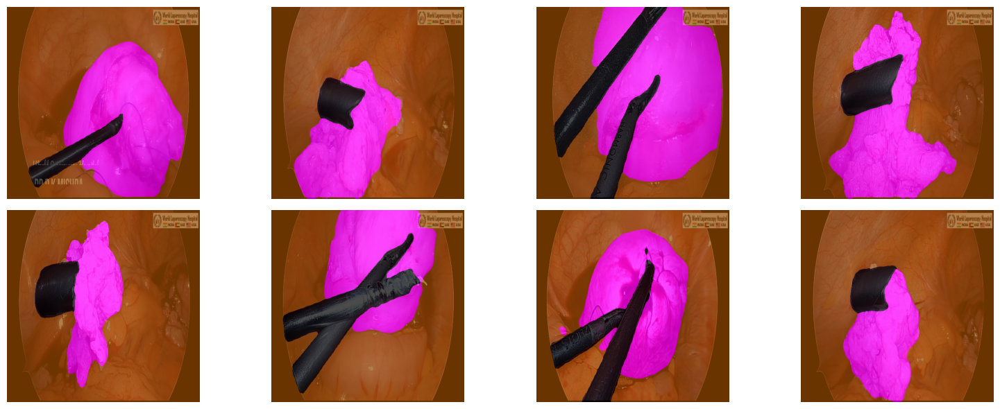

In [ ]:
visualize_deeplabv3(valid_dataset, num_images=8, alpha=0.7)

In [2]:
!pip install onnx onnxscript

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 99.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 714.8/714.8 kB 39.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.8/166.8 kB 19.7 MB/s eta 0:00:00


In [3]:
!pip install onnxruntime-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.3/270.3 MB 5.4 MB/s eta 0:00:00


In [ ]:
import torch
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

cuda


In [ ]:
dummy_input = torch.randn(1, 3, 512, 512).to(device)
onnx_model_path = "DeepLabV3_models/deeplabv3_r50_best_Pan.onnx"
torch.onnx.export(
    model,
    dummy_input,
    onnx_model_path,
    opset_version=19,
    input_names=["input"],
    output_names=["output"],
    do_constant_folding=True,
)
print(f"ONNX export {onnx_model_path} completed successfully!")

W0425 20:23:47.863000 2630 torch/onnx/_internal/exporter/_schemas.py:455] Missing annotation for parameter 'input' from (input, rois, spatial_scale: 'float', pooled_height: 'int', pooled_width: 'int', sampling_ratio: 'int' = -1, aligned: 'bool' = False). Treating as an Input.
W0425 20:23:47.864000 2630 torch/onnx/_internal/exporter/_schemas.py:455] Missing annotation for parameter 'rois' from (input, rois, spatial_scale: 'float', pooled_height: 'int', pooled_width: 'int', sampling_ratio: 'int' = -1, aligned: 'bool' = False). Treating as an Input.
W0425 20:23:47.866000 2630 torch/onnx/_internal/exporter/_schemas.py:455] Missing annotation for parameter 'input' from (input, boxes, output_size: 'Sequence[int]', spatial_scale: 'float' = 1.0). Treating as an Input.
W0425 20:23:47.869000 2630 torch/onnx/_internal/exporter/_schemas.py:455] Missing annotation for parameter 'boxes' from (input, boxes, output_size: 'Sequence[int]', spatial_scale: 'float' = 1.0). Treating as an Input.


[torch.onnx] Obtain model graph for `DeepLabV3([...]` with `torch.export.export(..., strict=False)`...
[torch.onnx] Obtain model graph for `DeepLabV3([...]` with `torch.export.export(..., strict=False)`... ✅
[torch.onnx] Run decomposition...


/usr/lib/python3.12/copyreg.py:99: FutureWarning: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
  return cls.__new__(cls, *args)


[torch.onnx] Run decomposition... ✅
[torch.onnx] Translate the graph into ONNX...
[torch.onnx] Translate the graph into ONNX... ✅
ONNX export DeepLabV3_models/deeplabv3_r50_best_Pan.onnx completed successfully!


In [13]:
import onnxruntime
import numpy as np
import cv2
import torch
import os
import random

# Load image and preprocess
img_path = "datasets/sispanseg/valid/images/Laparoscopic-Myomectomy-with-Baseball-Suturing-22-_jpg.rf.04929e16d4ace3507c937c4e1ce8a333.jpg"

mean = np.array([0.485, 0.456, 0.406], dtype=np.float32)
std = np.array([0.229, 0.224, 0.225], dtype=np.float32)

img = cv2.imread(img_path)
img_resized = cv2.resize(img, (512, 512))
img_input = img_resized[:, :, ::-1].astype(np.float32) / 255.0
img_input = (img_input - mean) / std
img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

# Run inference
session = onnxruntime.InferenceSession("DeepLabV3_models/deeplabv3_r50_best_Pan.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name
outputs = session.run(None, {input_name: img_input})

# outputs is a list
print("Output:", [o.shape for o in outputs])

Output: [(1, 3, 512, 512)]


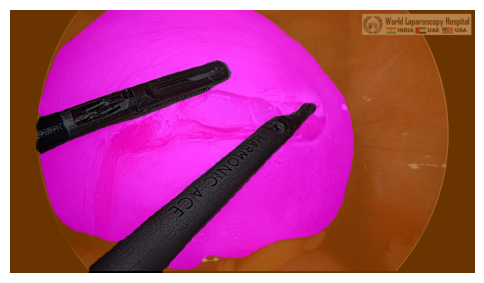

In [6]:
CATEGORY_COLORS = {
    0: [0, 0, 0],           # Things (Black)
    1: [255, 0, 255],       # Uterus (Magenta)
    2: [0, 75, 150],        # BG (Brown)
}
orig_h, orig_w = img.shape[:2]

# 1. Create a color palette array (fast lookup)
palette_map = np.zeros((256, 3), dtype=np.uint8)
for i, color in CATEGORY_COLORS.items():
    palette_map[i] = color

# 2. Apply the colors in one vectorized step
mask = np.argmax(outputs[0].squeeze(), axis=0).astype(np.uint8)
color_mask = palette_map[mask] # Instant mapping

color_mask = cv2.resize(color_mask, (orig_w, orig_h))

# 3. Create a fast overlay
overlay = cv2.addWeighted(img, 0.3, color_mask, 0.7, 0)

import matplotlib.pyplot as plt
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

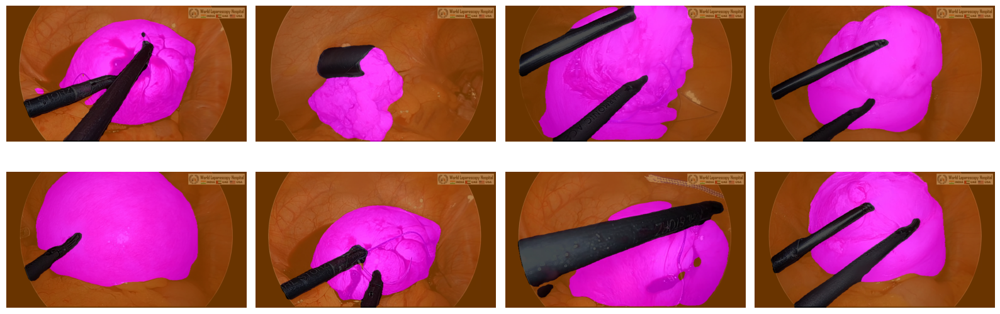

In [ ]:
import numpy as np
import os
import random
# ---------------- CONFIG ----------------
val_dir = "datasets/sispanseg/valid/images/"

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 3 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(2, 4, ii+1)

    img = cv2.imread(image)
    img_resized = cv2.resize(img, (512, 512))
    img_input = img_resized[:, :, ::-1].astype(np.float32) / 255.0
    img_input = (img_input - mean) / std
    img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

    outputs = session.run(None, {input_name: img_input})

    orig_h, orig_w = img.shape[:2]

    mask = np.argmax(outputs[0].squeeze(), axis=0).astype(np.uint8)
    color_mask = palette_map[mask] # Instant mapping

    color_mask = cv2.resize(color_mask, (orig_w, orig_h))
    overlay = cv2.addWeighted(img, 0.3, color_mask, 0.7, 0)

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()

In [10]:

import onnxruntime
import numpy as np
import cv2
import torch

img_path = "datasets/sispanseg/valid/images/Laparoscopic-Myomectomy-with-Baseball-Suturing-22-_jpg.rf.04929e16d4ace3507c937c4e1ce8a333.jpg"

img = cv2.imread(img_path)

if img is None:
    raise FileNotFoundError(f"Image not found at {img_path}")

img_resized2 = cv2.resize(img, (640, 640))
img_input2 = img_resized2.astype(np.float32) / 255.0
img_input2 = img_input2.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

# Run inference
session2 = onnxruntime.InferenceSession("/content/gdrive/MyDrive/yolov11/runs/segment/train2/weights/best.onnx", providers=["CPUExecutionProvider"])
input_name2 = session2.get_inputs()[0].name
outputs2 = session2.run(None, {input_name2: img_input2})

print("Output:", [o.shape for o in outputs2])

out0 = outputs2[0]
out1 = outputs2[1]

print("out0 shape:", out0.shape)
print("out1 shape:", out1.shape)

# inspect ONE prediction row
row = out0[0, 0]
print("one row length:", row.shape[0])
print("first 10 values:", row[:10])
print("last 40 values:", row[-40:])

Output: [(1, 300, 38), (1, 32, 160, 160)]
out0 shape: (1, 300, 38)
out1 shape: (1, 32, 160, 160)
one row length: 38
first 10 values: [ 3.7244217e+01  1.2722181e+02  3.0178159e+02  3.4901880e+02
  9.8370612e-01  1.0000000e+00 -4.5426339e-01  1.5366012e-01
  3.8746414e-01  1.3911948e+00]
last 40 values: [ 3.7244217e+01  1.2722181e+02  3.0178159e+02  3.4901880e+02
  9.8370612e-01  1.0000000e+00 -4.5426339e-01  1.5366012e-01
  3.8746414e-01  1.3911948e+00  2.6360633e+00  3.4564872e+00
 -3.2042322e+00  2.0463197e+00  3.6979318e-01  2.1653238e-01
 -4.1203146e+00 -6.3068885e-01  3.4082320e+00  2.9958746e-01
 -5.0234575e+00 -3.4030871e+00 -1.4585541e+00 -3.1525819e+00
  3.5488605e-03  1.0635324e+00 -9.8836970e-01 -3.6124861e+00
 -2.2661331e+00 -2.2901696e-01  1.3286602e-01 -3.2386035e-01
 -3.1513677e+00  7.6274019e-01  1.5334923e+00  1.2291429e+00
 -4.8777649e-01  6.2035632e-01]


In [16]:
class_names = ['bg', 'Grasper', 'Harmonic_Ace', 'Myoma_Screw', 'Needle_Holder', 'Suction', 'Trocar']

import math
import time

colors = [
    (0, 0, 0),
    (0, 0, 255),     # Red - Grasper
    (0, 255, 0),     # Green - Harmonic_Ace
    (255, 0, 0),     # Blue - Myoma_Screw
    (0, 255, 255),   # Yellow - Needle_Holder
    (255, 0, 255),   # Magenta - Suction
    (255, 255, 0)    # Cyan - Trocar
]

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def draw_detections(image, boxes, scores, class_ids, mask_alpha=0.3, mask_maps=None):
    img_height, img_width = image.shape[:2]
    size = min([img_height, img_width]) * 0.0015
    text_thickness = int(min([img_height, img_width]) * 0.003)

    mask_img = draw_masks(image, boxes, class_ids, mask_alpha, mask_maps)

    # Draw bounding boxes and labels of detections
    for box, score, class_id in zip(boxes, scores, class_ids):
        color = colors[class_id]

        x1, y1, x2, y2 = box.astype(int)

        # Draw rectangle
        cv2.rectangle(mask_img, (x1, y1), (x2, y2), color, 2)

        label = class_names[class_id]
        caption = f'{label} {int(score * 100)}%'
        (tw, th), _ = cv2.getTextSize(text=caption, fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                                      fontScale=size, thickness=text_thickness)
        th = int(th * 1.2)

        # cv2.rectangle(mask_img, (x1, y1),
        #               (x1 + tw, y1 - th), color, -1)

        cv2.putText(mask_img, caption, (x1, y1),
                    cv2.FONT_HERSHEY_SIMPLEX, size, color, text_thickness, cv2.LINE_AA)

    return mask_img

def draw_masks(image, boxes, class_ids, mask_alpha=0.3, mask_maps=None):
    mask_img = image.copy()

    # Draw bounding boxes and labels of detections
    for i in range(len(mask_maps)):
        box = boxes[i]
        class_id = class_ids[i]

        color = colors[class_id]

        x1, y1, x2, y2 = box.astype(int)

        # Draw fill mask image
        if mask_maps is None:
            cv2.rectangle(mask_img, (x1, y1), (x2, y2), color, -1)
        else:
            crop_mask = mask_maps[i][y1:y2, x1:x2, np.newaxis]
            crop_mask_img = mask_img[y1:y2, x1:x2]
            crop_mask_img = crop_mask_img * (1 - crop_mask) + crop_mask * color
            mask_img[y1:y2, x1:x2] = crop_mask_img

    return cv2.addWeighted(mask_img, mask_alpha, image, 1 - mask_alpha, 0)

class YOLOSeg:
    def __init__(self, path, conf_thres=0.7, num_masks=32):
        self.conf_threshold = conf_thres
        self.num_masks = num_masks

        # Initialize model
        self.initialize_model(path)

    def __call__(self, image):
        return self.segment_objects(image)

    def initialize_model(self, path):
        self.session2 = onnxruntime.InferenceSession(path,
                                                    providers=['CUDAExecutionProvider',
                                                               'CPUExecutionProvider'])
        # Get model info
        self.get_input_details()
        self.get_output_details()

    def segment_objects(self, image):
        input_tensor = self.prepare_input(image)

        # Perform inference on the image
        outputs = self.inference(input_tensor)

        self.boxes, self.scores, self.class_ids, mask_pred = self.process_box_output(outputs[0])
        self.mask_maps = self.process_mask_output(mask_pred, outputs[1])

        return self.boxes, self.scores, self.class_ids, self.mask_maps

    def prepare_input(self, image):
        self.img_height, self.img_width = image.shape[:2]

        input_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize input image
        input_img = cv2.resize(input_img, (self.input_width, self.input_height))

        # Scale input pixel values to 0 to 1
        input_img = input_img / 255.0
        input_img = input_img.transpose(2, 0, 1)
        input_tensor = input_img[np.newaxis, :, :, :].astype(np.float32)

        return input_tensor

    def inference(self, input_tensor):
        start = time.perf_counter()
        outputs = self.session2.run(self.output_names, {self.input_names[0]: input_tensor})

        # print(f"Inference time: {(time.perf_counter() - start)*1000:.2f} ms")
        return outputs

    def process_box_output(self, box_output):
        preds = np.squeeze(box_output)  # (300, 38)

        boxes = preds[:, 0:4]           # xyxy already
        scores = preds[:, 4]            # confidence
        class_ids = preds[:, 5].astype(int)
        mask_preds = preds[:, 6:]       # 32 mask coeffs

        keep = scores > self.conf_threshold
        if not np.any(keep):
            return [], [], [], np.array([])

        boxes = boxes[keep]
        scores = scores[keep]
        class_ids = class_ids[keep]
        mask_preds = mask_preds[keep]

        # Rescale boxes from input size to original image size
        boxes[:, [0, 2]] *= self.img_width / self.input_width
        boxes[:, [1, 3]] *= self.img_height / self.input_height

        return boxes, scores, class_ids, mask_preds

    def process_mask_output(self, mask_coeffs, proto):

        if mask_coeffs.shape[0] == 0:
            return []

        proto = np.squeeze(proto)  # (32, mh, mw)
        mh, mw = proto.shape[1:]

        # (N, mh, mw)
        masks = sigmoid(mask_coeffs @ proto.reshape(32, -1))
        masks = masks.reshape(-1, mh, mw)

        valid_masks = []

        for i, box in enumerate(self.boxes):
            x1, y1, x2, y2 = box.astype(int)

            if x2 <= x1 or y2 <= y1:
                continue

            # map box to proto space
            px1 = int(x1 / self.img_width * mw)
            px2 = int(x2 / self.img_width * mw)
            py1 = int(y1 / self.img_height * mh)
            py2 = int(y2 / self.img_height * mh)

            px1 = np.clip(px1, 0, mw)
            px2 = np.clip(px2, 0, mw)
            py1 = np.clip(py1, 0, mh)
            py2 = np.clip(py2, 0, mh)

            if px2 <= px1 or py2 <= py1:
                continue

            crop = masks[i, py1:py2, px1:px2]
            crop = cv2.resize(crop, (x2 - x1, y2 - y1))
            crop = (crop > 0.5).astype(np.uint8)

            full = np.zeros((self.img_height, self.img_width), dtype=np.uint8)
            full[y1:y2, x1:x2] = crop

            valid_masks.append(full)

        return np.array(valid_masks)

    def draw_detections(self, image, draw_scores=True, mask_alpha=0.4):
        return draw_detections(image, self.boxes, self.scores,
                               self.class_ids, mask_alpha)

    def draw_masks(self, image, draw_scores=True, mask_alpha=0.7):
        return draw_detections(image, self.boxes, self.scores,
                               self.class_ids, mask_alpha, mask_maps=self.mask_maps)

    def get_input_details(self):
        model_inputs = self.session2.get_inputs()
        self.input_names = [model_inputs[i].name for i in range(len(model_inputs))]

        self.input_shape = model_inputs[0].shape
        self.input_height = self.input_shape[2]
        self.input_width = self.input_shape[3]

    def get_output_details(self):
        model_outputs = self.session2.get_outputs()
        self.output_names = [model_outputs[i].name for i in range(len(model_outputs))]

    @staticmethod
    def rescale_boxes(boxes, input_shape, image_shape):
        # Rescale boxes to original image dimensions
        input_shape = np.array([input_shape[1], input_shape[0], input_shape[1], input_shape[0]])
        boxes = np.divide(boxes, input_shape, dtype=np.float32)
        boxes *= np.array([image_shape[1], image_shape[0], image_shape[1], image_shape[0]])

        return boxes

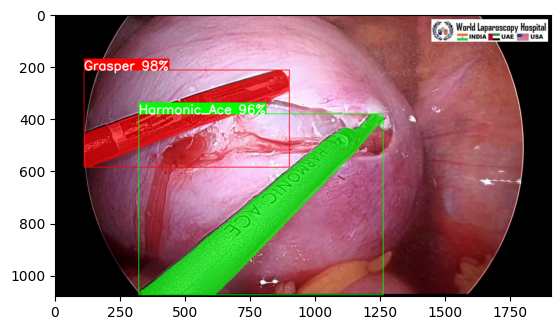

In [12]:
img_path = "datasets/sispanseg/valid/images/Laparoscopic-Myomectomy-with-Baseball-Suturing-22-_jpg.rf.04929e16d4ace3507c937c4e1ce8a333.jpg"

img = cv2.imread(img_path)

if img is None:
    raise FileNotFoundError(f"Image not found at {img_path}")

# Initialize YOLOv26 Instance Segmentator
yoloseg = YOLOSeg("/content/gdrive/MyDrive/yolov11/runs/segment/train2/weights/best.onnx", conf_thres=0.3)

# Detect Objects
yoloseg(img)

# Draw detections
combined_img = yoloseg.draw_masks(img)

import matplotlib.pyplot as plt
plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))

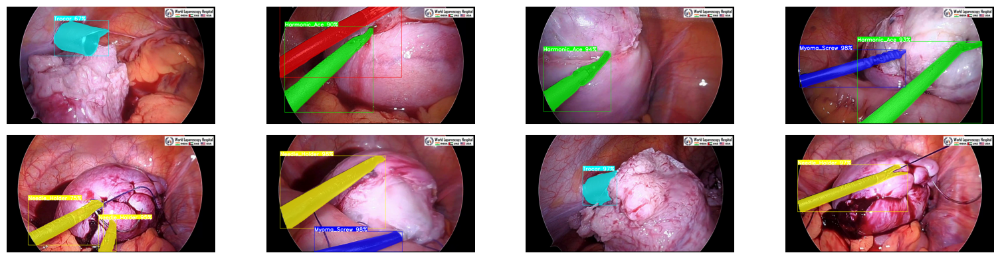

In [ ]:
import os, random, cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
results_dir = "datasets/sispanseg/valid/images/"

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(results_dir, f)
            for f in os.listdir(results_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 2 * rows))

for i, image in enumerate(sample_imgs):
    plt.subplot(rows, cols, i + 1)
    image = cv2.imread(image)

    # Detect Objects
    yoloseg(image)
    # Draw detections
    combined_img = yoloseg.draw_masks(image)
    combined_img = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)
    plt.imshow(combined_img)
    plt.axis("off")

plt.tight_layout()
plt.show()

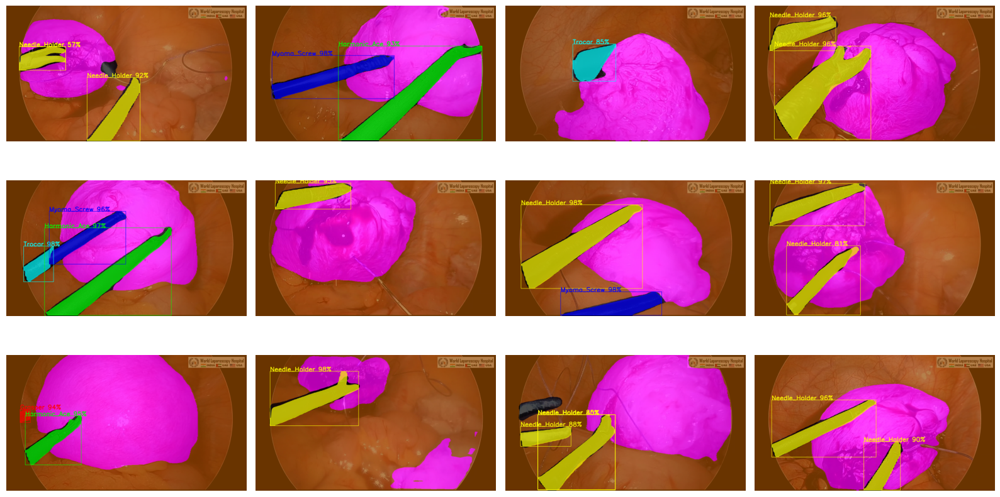

In [17]:
import numpy as np
import os
import random
# ---------------- CONFIG ----------------
val_dir = "datasets/sispanseg/valid/images/"

# visualization layout
N = 12
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 3 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(rows, 4, ii+1)

    img = cv2.imread(image)
    img_resized = cv2.resize(img, (512, 512))
    img_input = img_resized[:, :, ::-1].astype(np.float32) / 255.0
    img_input = (img_input - mean) / std
    img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

    outputs = session.run(None, {input_name: img_input})

    # Detect Objects
    yoloseg(img)

    orig_h, orig_w = img.shape[:2]

    mask = np.argmax(outputs[0].squeeze(), axis=0).astype(np.uint8)
    color_mask = palette_map[mask] # Instant mapping

    color_mask = cv2.resize(color_mask, (orig_w, orig_h))
    overlay = cv2.addWeighted(img, 0.3, color_mask, 0.7, 0)

    # Draw detections
    combined_img = yoloseg.draw_masks(overlay)

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()